# PREDICTIVE ANALYSIS - CHURN

> **Objective** : To predict,if the customer is going to churn or not

### Agenda
* Data Understanding
* Imputation
* EDA 
    * Univariate analysis
    * Bivariate analysis
* Outlier treatment
* Scaling 
    * Zscore
    * Min-max 
* Logistic
* Remove the independent variables,cluster them
* Add them to dataset,see if there is any change in metrics
* Logistic + Clustering
* Random Forest
* Random forest + clustering
* PCA + Clustering
* Linear  Regression
* KNN


    

In [7]:
%matplotlib inline

import sys
if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")

import pandas as pd
pd.set_option('display.max_columns',None)

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
from plotly import __version__
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
import cufflinks as cf


from  sklearn.preprocessing  import Imputer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, recall_score, precision_score, accuracy_score
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.grid_search import GridSearchCV


### Reading the data

In [16]:
churn=pd.read_csv('Churn_MV.csv')
churn

,Account Length,VMail Message,Day Mins,Eve Mins,Night Mins,Intl Mins,CustServ Calls,Churn,Intl Plan,VMail Plan,Day Calls,Day Charge,Daily Charges MV,Eve Calls,Eve Charge,Night Calls,Night Charge,Intl Calls,Intl Charge,State,Area Code,Phone
0,128,25,265.1,197.4,244.7,10.0,1,0,0,1,110,45.07,45.07,99,16.78,91,11.01,3,2.70,KS,415,382-4657
1,107,26,161.6,195.5,254.4,13.7,1,0,0,1,123,27.47,27.47,103,16.62,103,11.45,3,3.70,OH,415,371-7191
2,137,0,243.4,121.2,162.6,12.2,0,0,0,0,114,41.38,41.38,110,10.30,104,7.32,5,3.29,NJ,415,358-1921
3,84,0,299.4,61.9,196.9,6.6,2,0,1,0,71,50.90,50.90,88,5.26,89,8.86,7,1.78,OH,408,375-9999
4,75,0,166.7,148.3,186.9,10.1,3,0,1,0,113,28.34,28.34,122,12.61,121,8.41,3,2.73,OK,415,330-6626
5,118,0,223.4,220.6,203.9,6.3,0,0,1,0,98,37.98,37.98,101,18.75,118,9.18,6,1.70,AL,510,391-8027
6,121,24,218.2,348.5,212.6,7.5,3,0,0,1,88,37.09,26.69,108,29.62,118,9.57,7,2.03,MA,510,355-9993
7,147,0,157.0,103.1,211.8,7.1,0,0,1,0,79,26.69,31.37,94,8.76,96,9.53,6,1.92,MO,415,329-9001
8,117,0,184.5,351.6,215.8,8.7,1,0,0,0,97,31.37,43.96,80,29.89,90,9.71,4,2.35,LA,408,335-4719
9,141,37,258.6,222.0,326.4,11.2,0,0,1,1,84,43.96,21.95,111,18.87,97,14.69,5,3.02,WV,415,330-8173


### Data Understanding

In [17]:
churn.columns, churn.shape

(Index(['Account Length', 'VMail Message', 'Day Mins', 'Eve Mins', 'Night Mins',
        'Intl Mins', 'CustServ Calls', 'Churn', 'Intl Plan', 'VMail Plan',
        'Day Calls', 'Day Charge', 'Daily Charges MV', 'Eve Calls',
        'Eve Charge', 'Night Calls', 'Night Charge', 'Intl Calls',
        'Intl Charge', 'State', 'Area Code', 'Phone'],
       dtype='object'), (3333, 22))

* There are alteranate spaces between each rows. Let's visualize them

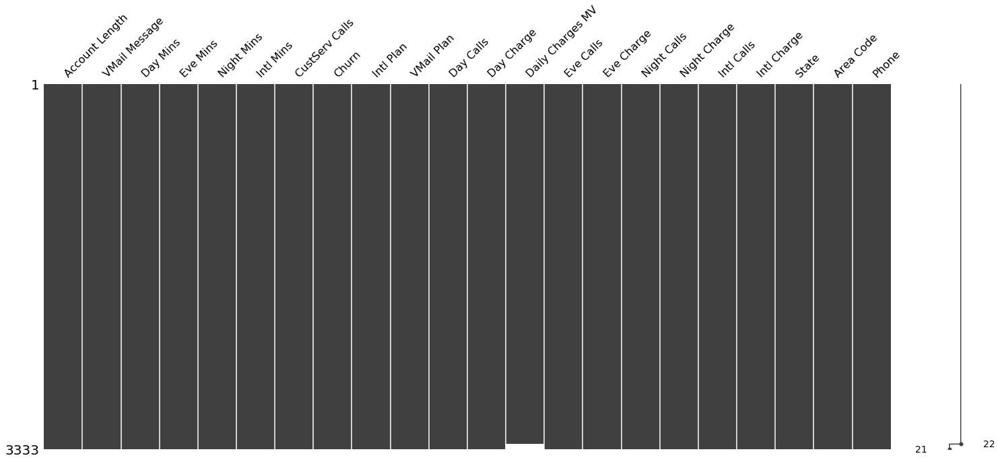

In [18]:
msno.matrix(churn)

* Alternate rows are missing in the data,removing them.

In [19]:
## Removing the missing alternate rows
churn=churn.dropna(how='all')

* Visualizing the rows again to see if the rows are gone.

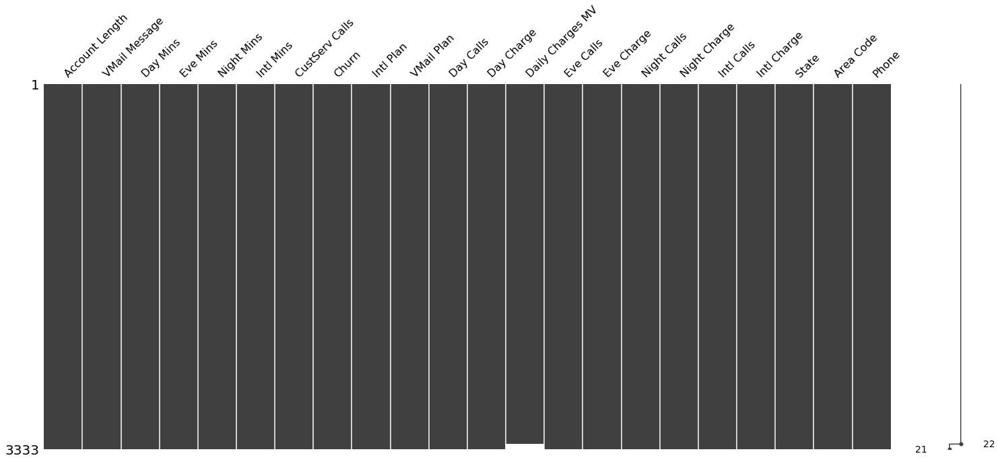

In [20]:
msno.matrix(churn)

* We can see there are few gaps which represents missing values

Noting down which datatypes should the variables actually be.

* Account Length - int
* VMail Message  -int
* Day Mins - int
* Eve Mins - int
* Night Mins - int
* Intl Mins - int
* CustServ Calls - cat
* Churn- cat
* Intl Plan - cat
* VMail Plan - cat
* Day Calls -int
* Day Charge - int
* Daily Charges MV -int
* Eve Calls - int
* Eve Charge - int 
* Night Calls - int 
* Night Charge - int
* Intl Calls  - int
* Intl Charge - int 
* State - cat
* Area Code
* Phone

In [21]:
churn.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3333 entries, 0 to 3332
Data columns (total 22 columns):
Account Length      3333 non-null int64
VMail Message       3333 non-null int64
Day Mins            3333 non-null float64
Eve Mins            3333 non-null float64
Night Mins          3333 non-null float64
Intl Mins           3333 non-null float64
CustServ Calls      3333 non-null int64
Churn               3333 non-null int64
Intl Plan           3333 non-null int64
VMail Plan          3333 non-null int64
Day Calls           3333 non-null int64
Day Charge          3333 non-null float64
Daily Charges MV    3283 non-null float64
Eve Calls           3333 non-null int64
Eve Charge          3333 non-null float64
Night Calls         3333 non-null int64
Night Charge        3333 non-null float64
Intl Calls          3333 non-null int64
Intl Charge         3333 non-null float64
State               3333 non-null object
Area Code           3333 non-null int64
Phone               3333 non-null 

In [22]:
churn['Churn']=churn['Churn'].astype('category')
churn['Intl Plan']=churn['Intl Plan'].astype('category')
churn['VMail Plan']=churn['VMail Plan'].astype('category')


In [23]:
churn.isnull().sum()

Account Length       0
VMail Message        0
Day Mins             0
Eve Mins             0
Night Mins           0
Intl Mins            0
CustServ Calls       0
Churn                0
Intl Plan            0
VMail Plan           0
Day Calls            0
Day Charge           0
Daily Charges MV    50
Eve Calls            0
Eve Charge           0
Night Calls          0
Night Charge         0
Intl Calls           0
Intl Charge          0
State                0
Area Code            0
Phone                0
dtype: int64

In [24]:
churn.dtypes

Account Length         int64
VMail Message          int64
Day Mins             float64
Eve Mins             float64
Night Mins           float64
Intl Mins            float64
CustServ Calls         int64
Churn               category
Intl Plan           category
VMail Plan          category
Day Calls              int64
Day Charge           float64
Daily Charges MV     float64
Eve Calls              int64
Eve Charge           float64
Night Calls            int64
Night Charge         float64
Intl Calls             int64
Intl Charge          float64
State                 object
Area Code              int64
Phone                 object
dtype: object

In [25]:
## Removing the null values present in Daily Charges MV 
## churn.drop(['Daily Charges MV'],axis=1,inplace=True)

* There are 50 null values in Daily Charges MV instead of dropping imputing them.

### Data Imputation

This can be in many ways.Few of them are:
* Mean
* Median # we are taking median here
* KNN

#### Mean Imputation

In [26]:
churn['Daily Charges MV'].fillna(churn['Daily Charges MV'].mean,inplace=True)

#### Median Imputation

In [30]:
median_value = churn['Daily Charges MV'].median()
churn['Daily Charges MV']= churn['Daily Charges MV'].fillna(median_value)

TypeError: float() argument must be a string or a number, not 'method'

    * Finding the correlation between Day Charge and Daily Charges MV using Scatterplot

TypeError: float() argument must be a string or a number, not 'method'

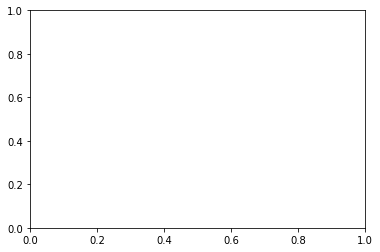

In [28]:
plt.scatter(churn['Daily Charges MV'],churn['Day Charge'])

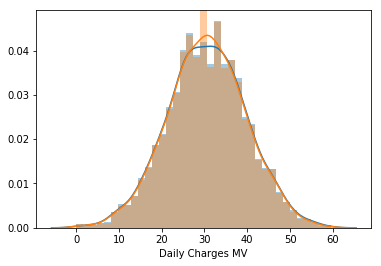

In [23]:
sns.distplot(churn['Day Charge'])
sns.distplot(churn['Daily Charges MV'])

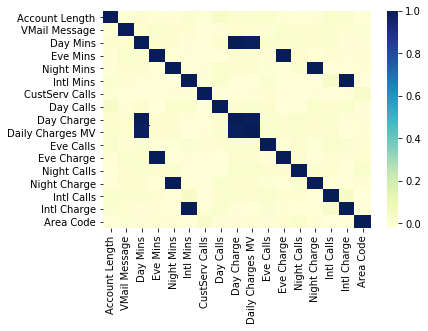

In [24]:
d=churn.corr()
sns.heatmap(d,cmap="YlGnBu")

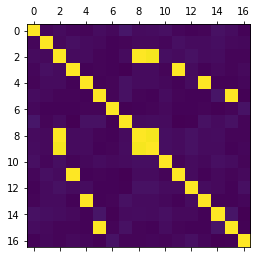

In [25]:
plt.matshow(churn.corr(),fignum='integer')

#### Imputation of the most frequent value 

In [ ]:
imp = Imputer(missing_values='NaN',
            strategy='most_frequent')
imp_col = imp.fit_transform(churn[['Daily Charges MV']])

churn['Daily Charges MV'] = imp_col == 1

#### Checking the missing value accuracy

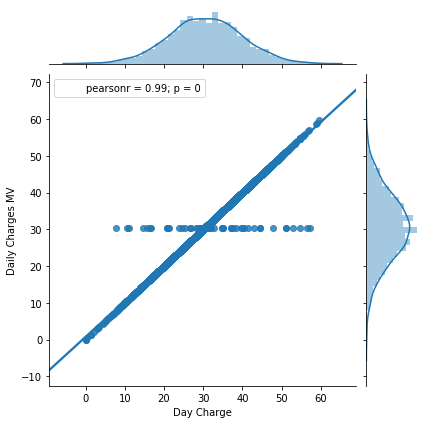

In [41]:
sns.jointplot(x='Day Charge',y = 'Daily Charges MV',data=churn,kind='reg')

#### Try doing KNN imputation also.
* Now that the Day Charge and Daily Charges MV are 99% correlated, dropping one the column
    * Dropping Daily Charges MV column

In [27]:
churn.drop(['Daily Charges MV'],axis=1,inplace=True)

## Exploratory Data Analysis

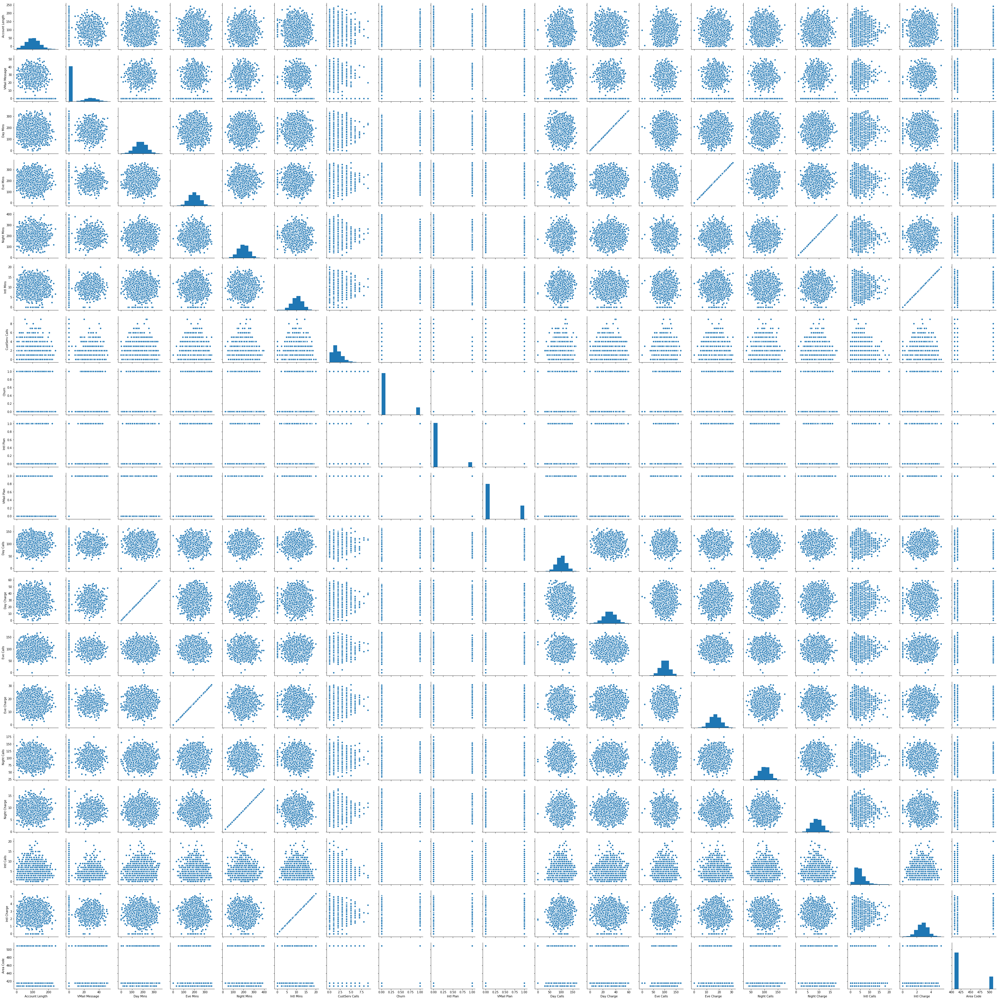

In [28]:
sns.pairplot(churn)

### Univariate Analysis

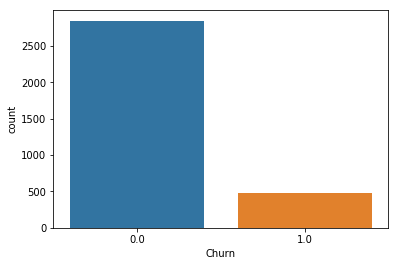

In [44]:
sns.countplot(x='Churn',data=churn)

In [46]:
churn.Churn.value_counts()

0.0    2850
1.0     483
Name: Churn, dtype: int64

* From the above data, we can infer that out of 3333 customers, 483 customers are churned out from their services.
> - This is a class imbalanced data.
> - Only 14.5 % data is belongs to churned class.

### Bivariate Analysis

* PLotting a countplot to see no of people have churned based on Customer Service calls

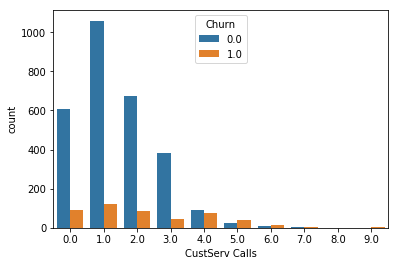

In [48]:
sns.countplot(x='CustServ Calls',hue = 'Churn',data=churn )

+ From the above plot,we can infer that as the calls increases,Customers are more likely to churn.

* Plotting to see the number of calls based on Day Charge

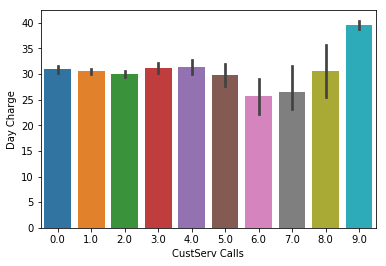

In [50]:
sns.barplot(x='CustServ Calls',y='Day Charge',data=churn )

* From the above graph we can infer that as the Day Charges increases, customer Service calls are also increasing ie.,customers who have high day charges,those customers are likely to call contact customer care.

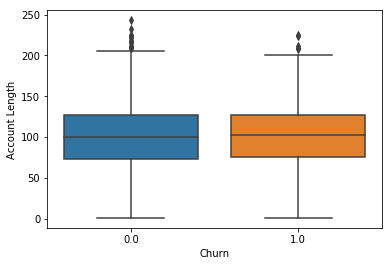

In [54]:
sns.boxplot(x = 'Churn',y='Account Length',data=churn)

* From the above graph we can infer that account length has no significance on churning rate.

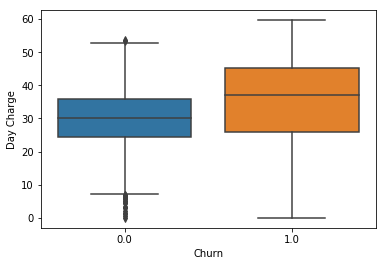

In [58]:
sns.boxplot(x="Churn",y="Day Charge",data=churn)
plt.show()

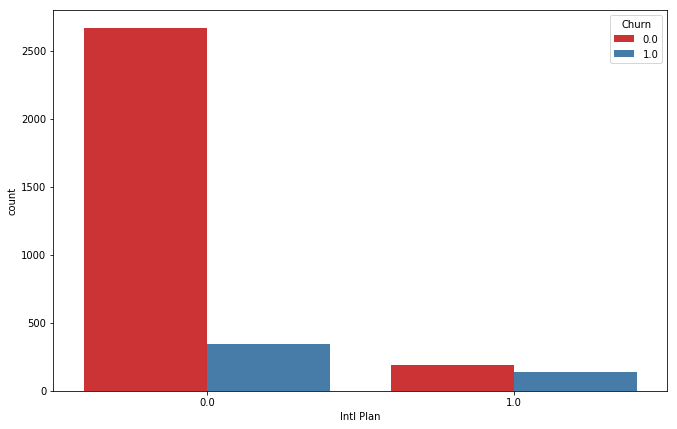

In [55]:
plt.figure(figsize=(11,7))
sns.countplot(x ='Intl Plan',hue='Churn',data = churn,palette='Set1')

* From the above graph we can infer that customers with intl. plan are more churning as compared to the customers with no intl.plan

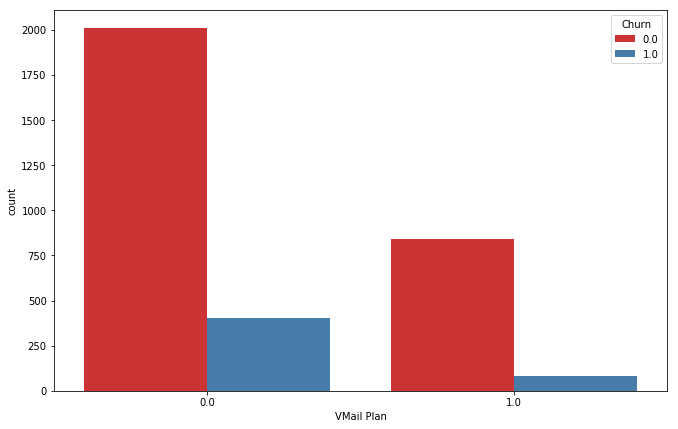

In [60]:
plt.figure(figsize=(11,7))
sns.countplot(x ='VMail Plan',hue='Churn',data = churn,palette='Set1')

### Multivariate Analysis

Text(0.5,0,'DAY CHARGE')

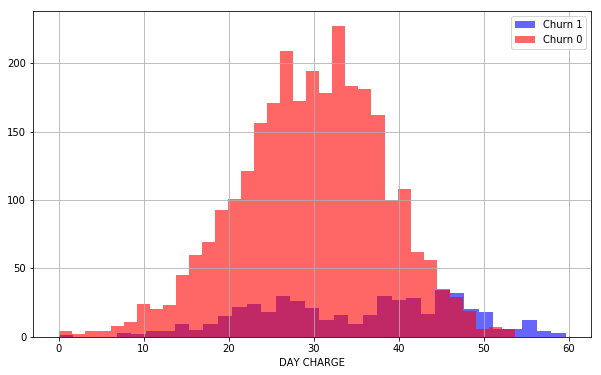

In [53]:
plt.figure(figsize=(10,6))
churn[churn['Churn']==1]['Day Charge'].hist(bins=35,color = 'blue',label = 'Churn 1',alpha = 0.6)
churn[churn['Churn']==0]['Day Charge'].hist(bins = 35,color = 'red',label = 'Churn 0',alpha = 0.6)
plt.legend()
plt.xlabel('DAY CHARGE')

* From the above graph,we can infer that the customers with high daily charge are more likely to churn.

Text(0.5,0,'INTL CHARGE')

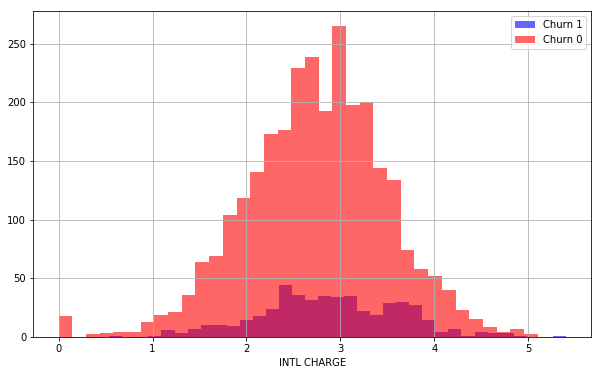

In [56]:
plt.figure(figsize=(10,6))
churn[churn['Churn']==1]['Intl Charge'].hist(bins=35,color = 'blue',label = 'Churn 1',alpha = 0.6)
churn[churn['Churn']==0]['Intl Charge'].hist(bins = 35,color = 'red',label = 'Churn 0',alpha = 0.6)
plt.legend()
plt.xlabel('INTL CHARGE')

* From the above graph we can infer that even moderate charge for Intl Plan is making customers churn.They might have service issues.

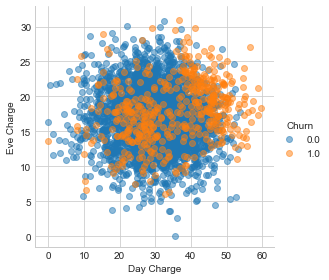

In [62]:
sns.set_style("whitegrid")
sns.FacetGrid(churn,hue="Churn",size=4)\
  .map(plt.scatter,"Day Charge","Eve Charge",alpha = 0.5)\
  .add_legend();
plt.show();


* From the above plot we can infer that the most of the customers who have churned have got heavy bills.

### Visualizing using Plotly library

In [70]:
init_notebook_mode(connected = True)
cf.go_offline()

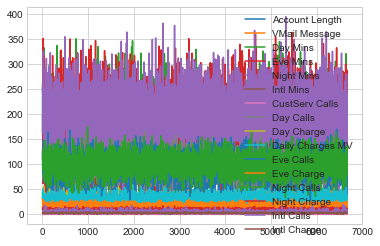

In [71]:
churn.plot()

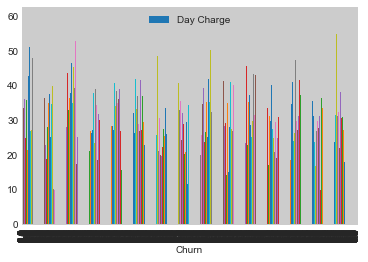

In [72]:
churn.plot(kind='bar',x='Churn',y='Day Charge')

### DONE WITH VISUALIZATION..!!

## CHECKING FOR MULTICOLINEARITY AND CORRELATION

In [74]:
corr_mat = churn.corr()

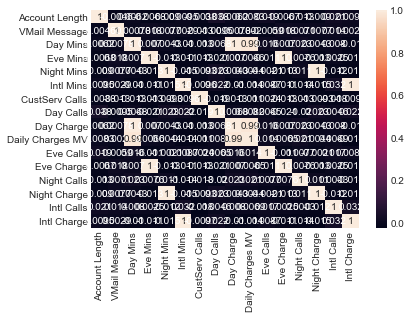

In [75]:
sns.heatmap(corr_mat,annot=True)

In [77]:
corr_mat

,Account Length,VMail Message,Day Mins,Eve Mins,Night Mins,Intl Mins,CustServ Calls,Day Calls,Day Charge,Daily Charges MV,Eve Calls,Eve Charge,Night Calls,Night Charge,Intl Calls,Intl Charge
Account Length,1.000000,-0.004628,0.006216,-0.006757,-0.008955,0.009514,-0.003796,0.038470,0.006214,0.008347,0.019260,-0.006745,-0.013176,-0.008960,0.020661,0.009546
VMail Message,-0.004628,1.000000,0.000778,0.017562,0.007681,0.002856,-0.013263,-0.009548,0.000776,0.001987,-0.005864,0.017578,0.007123,0.007663,0.013957,0.002884
Day Mins,0.006216,0.000778,1.000000,0.007043,0.004323,-0.010155,-0.013423,0.006750,1.000000,0.986681,0.015769,0.007029,0.022972,0.004300,0.008033,-0.010092
Eve Mins,-0.006757,0.017562,0.007043,1.000000,-0.012584,-0.011035,-0.012985,-0.021451,0.007050,0.006556,-0.011430,1.000000,0.007586,-0.012593,0.002541,-0.011067
Night Mins,-0.008955,0.007681,0.004323,-0.012584,1.000000,-0.015207,-0.009288,0.022938,0.004324,0.004402,-0.002093,-0.012592,0.011204,0.999999,-0.012353,-0.015180
Intl Mins,0.009514,0.002856,-0.010155,-0.011035,-0.015207,1.000000,-0.009640,0.021565,-0.010157,-0.013933,0.008703,-0.011043,-0.013605,-0.015214,0.032304,0.999993
CustServ Calls,-0.003796,-0.013263,-0.013423,-0.012985,-0.009288,-0.009640,1.000000,-0.018942,-0.013427,-0.011189,0.002423,-0.012987,-0.012802,-0.009277,-0.017561,-0.009675
Day Calls,0.038470,-0.009548,0.006750,-0.021451,0.022938,0.021565,-0.018942,1.000000,0.006753,0.008236,0.006462,-0.021449,-0.019557,0.022927,0.004574,0.021666
Day Charge,0.006214,0.000776,1.000000,0.007050,0.004324,-0.010157,-0.013427,0.006753,1.000000,0.986680,0.015769,0.007036,0.022972,0.004301,0.008032,-0.010094
Daily Charges MV,0.008347,0.001987,0.986681,0.006556,0.004402,-0.013933,-0.011189,0.008236,0.986680,1.000000,0.014114,0.006543,0.021397,0.004380,0.006897,-0.013887


In [79]:
churn.corr().unstack().sort_values().drop_duplicates()


Eve Mins          Day Calls          -0.021451
Day Calls         Eve Charge         -0.021449
                  Night Calls        -0.019557
CustServ Calls    Day Calls          -0.018942
Intl Calls        CustServ Calls     -0.017561
Night Charge      Intl Mins          -0.015214
Night Mins        Intl Mins          -0.015207
Intl Charge       Night Charge       -0.015186
Night Mins        Intl Charge        -0.015180
Daily Charges MV  Intl Mins          -0.013933
                  Intl Charge        -0.013887
Night Calls       Intl Charge        -0.013630
                  Intl Mins          -0.013605
CustServ Calls    Day Charge         -0.013427
Day Mins          CustServ Calls     -0.013423
VMail Message     CustServ Calls     -0.013263
Night Calls       Account Length     -0.013176
Eve Charge        CustServ Calls     -0.012987
Eve Mins          CustServ Calls     -0.012985
CustServ Calls    Night Calls        -0.012802
Eve Charge        Night Charge       -0.012601
Night Charge 

* From the above we can infer that 

##### Multicollinear variables

Night Mins   ,   Night Charge      0.999999

Eve Charge   ,   Eve Mins          1.000000

Day Charge   ,   Day Mins          1.000000

Intl Charge  ,  Intl Mins         0.999993

##### WE NEED TO DISCARD ONE OF THOSE VARIABLES.

#### Setting the columns which are not that important right now aside.

In [42]:
churn_separated = churn[['Area Code','Phone','State']]

In [43]:
churn.drop(['Area Code','Phone','State'],axis=1,inplace=True)

## OUTLIER TREATMENT

> This can be done in two ways :
    1. Remove them - if the outliers are removed,then the information present in those datapoints will be lost
    2. Treat them  - This is done using Clipping ie.,flooring and ceiling where we are rounding off the points which are not extreme so that their info can be retained.

> Plotting boxplots to check for outliers

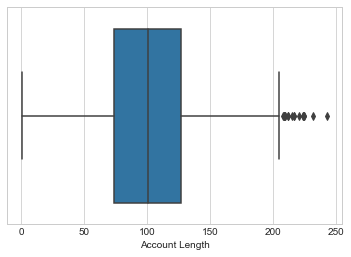

In [81]:
sns.boxplot(churn['Account Length'])

In [82]:
churn['Account Length'].clip(upper=200,inplace=True)

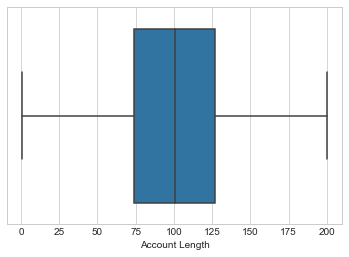

In [83]:
sns.boxplot(churn['Account Length'])

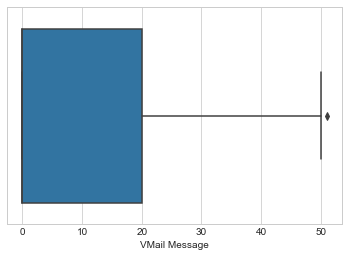

In [84]:
sns.boxplot(churn['VMail Message'])

* From the above graph we can infer that the Min value and the median lie on the same line and there is just one outlier which can be ignored.

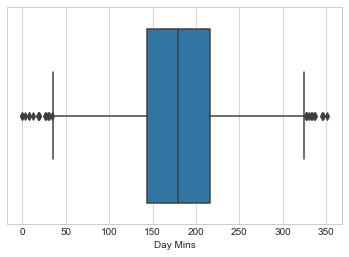

In [86]:
sns.boxplot(churn['Day Mins'])

* There are many outliers above and below the whiskers.

In [87]:
churn['Day Mins'].clip(lower=50,upper=320,inplace=True)

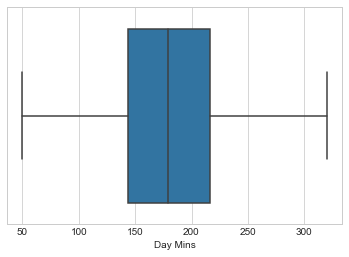

In [88]:
sns.boxplot(churn['Day Mins'])

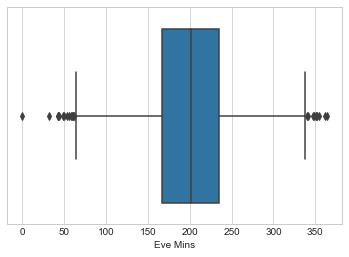

In [89]:
sns.boxplot(churn['Eve Mins'])

In [90]:
churn['Eve Mins'].clip(upper=320,lower=70,inplace=True)

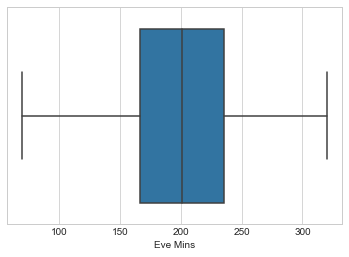

In [91]:
sns.boxplot(churn['Eve Mins'])

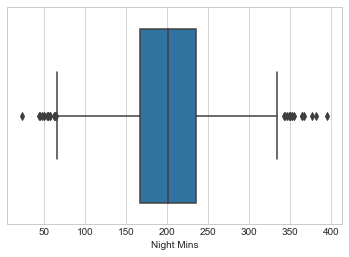

In [92]:
sns.boxplot(churn['Night Mins'])

In [94]:
churn['Night Mins'].clip(upper=320,lower=70,inplace=True)

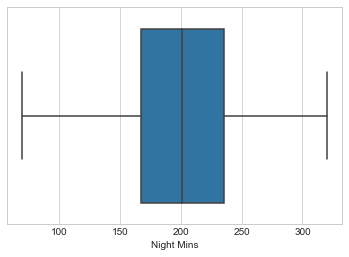

In [95]:
sns.boxplot(churn['Night Mins'])

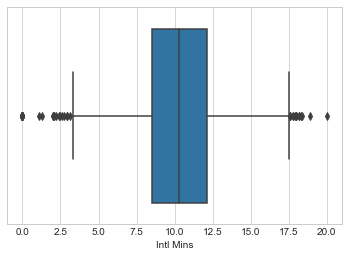

In [96]:
sns.boxplot(churn['Intl Mins'])

In [99]:
churn['Intl Mins'].clip(upper=17.5,lower=4,inplace=True)

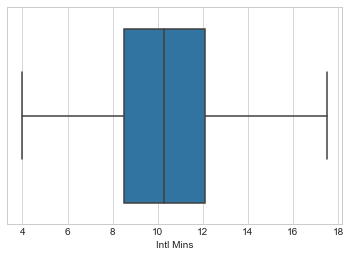

In [100]:
sns.boxplot(churn['Intl Mins'])

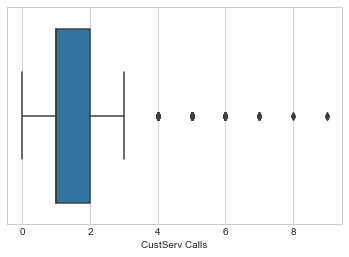

In [101]:
sns.boxplot(churn['CustServ Calls'])

In [102]:
churn['CustServ Calls'].clip(upper=3,inplace=True)

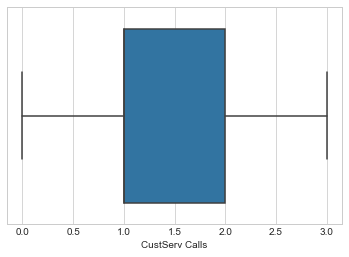

In [103]:
sns.boxplot(churn['CustServ Calls'])

In [104]:
np.median(churn['CustServ Calls'])

1.0

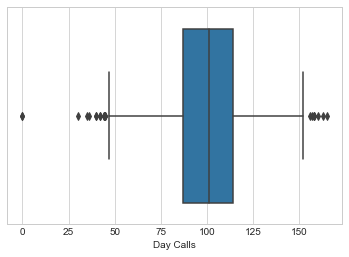

In [105]:
sns.boxplot(churn['Day Calls'])

In [106]:
churn['Day Calls'].clip(upper=140,lower=50,inplace=True)

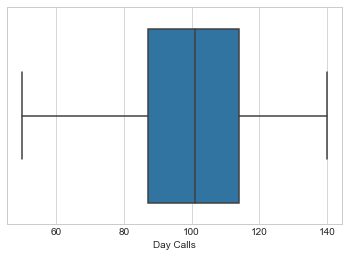

In [107]:
sns.boxplot(churn['Day Calls'])

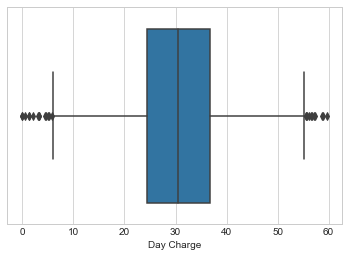

In [108]:
sns.boxplot(churn['Day Charge'])

In [109]:
churn['Day Charge'].clip(upper=52,lower=8,inplace=True)

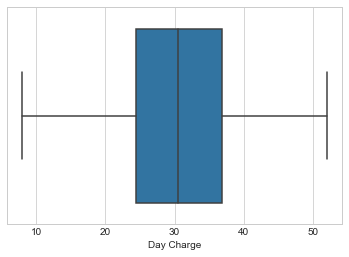

In [110]:
sns.boxplot(churn['Day Charge'])

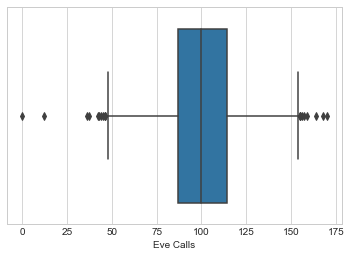

In [111]:
sns.boxplot(churn['Eve Calls'])

In [113]:
churn['Eve Calls'].clip(upper=140,lower=50,inplace=True)

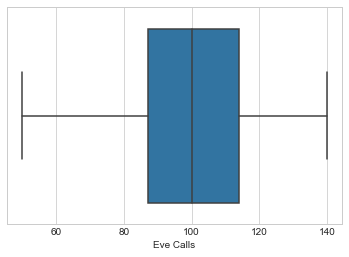

In [114]:
sns.boxplot(churn['Eve Calls'])

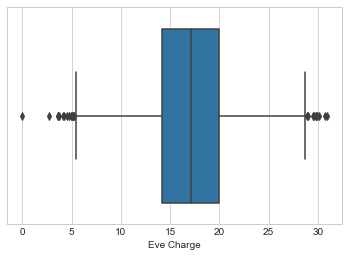

In [112]:
sns.boxplot(churn['Eve Charge'])

* From the above plot, we can infer that there are less number of outliers which will be compensated later.No need of clipping them.
* I have done clipping for few of the cases with less outliers which is not necessary 

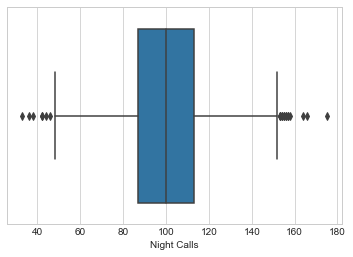

In [115]:
sns.boxplot(churn['Night Calls'])

In [116]:
churn['Night Calls'].clip(upper=150,lower=50,inplace=True)

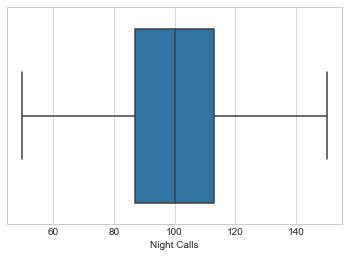

In [117]:
sns.boxplot(churn['Night Calls'])

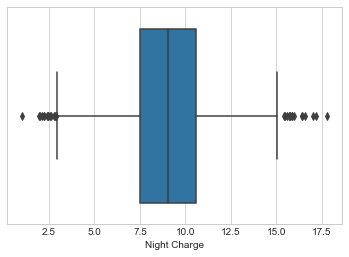

In [118]:
sns.boxplot(churn['Night Charge']) ## Clipping is not necessary since number is very less

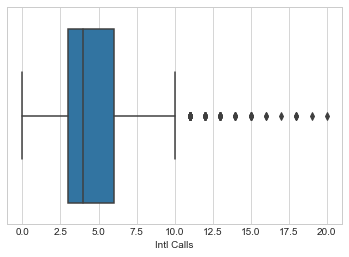

In [119]:
sns.boxplot(churn['Intl Calls'])

In [120]:
churn['Intl Calls'].clip(upper=10,inplace=True)

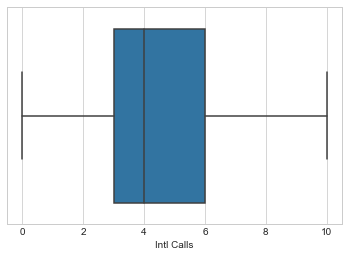

In [121]:
sns.boxplot(churn['Intl Calls'])

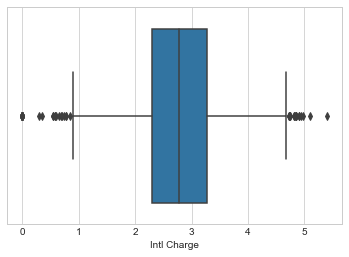

In [122]:
sns.boxplot(churn['Intl Charge'])

In [123]:
churn['Intl Charge'].clip(upper=4.5,lower=1,inplace=True)

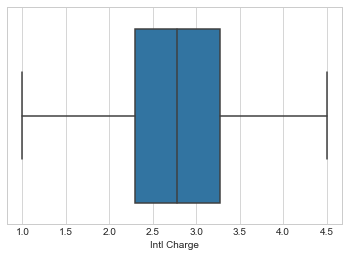

In [124]:
sns.boxplot(churn['Intl Charge'])

## Preprocessing is done..!!

* Now that the data is preprocessed, store it in some other variable so that it can be used later.

In [125]:
churn_cleaned_data=churn

### Separating dependent and independent variables

In [224]:
x = churn[['Account Length', 'VMail Message','CustServ Calls', 'Intl Plan', 'VMail Plan',
       'Day Calls', 'Day Charge', 'Eve Calls', 'Eve Charge', 'Night Calls',
       'Night Charge', 'Intl Calls', 'Intl Charge']]
y = churn['Churn']

In [225]:
#### Converting the columns to dummies 
x = pd.get_dummies(x,columns=['Intl Plan','VMail Plan'],drop_first=True)

In [226]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=256)

In [227]:
x_train.shape,x_test.shape

((2666, 13), (667, 13))

In [229]:
classifier = LogisticRegression(random_state=1)
classifier.fit(x_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=1, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

#### Predicting on train data

In [230]:
y_pred_train = classifier.predict(x_train)

#### Validating on train data

In [231]:
confusion_matrix = confusion_matrix(y_train, y_pred_train)
print(confusion_matrix)
print(classification_report(y_train,y_pred_train))

[[2252   37]
 [ 319   58]]
             precision    recall  f1-score   support

        0.0       0.88      0.98      0.93      2289
        1.0       0.61      0.15      0.25       377

avg / total       0.84      0.87      0.83      2666



#### Predicting on test data

In [232]:
y_pred_test = classifier.predict(x_test)

#### Validating on test data

In [235]:
confusion_matrix_test = confusion_matrix(y_test, y_pred_test)
print(confusion_matrix_test)
print(classification_report(y_test,y_pred_test))

[[549  12]
 [ 91  15]]
             precision    recall  f1-score   support

        0.0       0.86      0.98      0.91       561
        1.0       0.56      0.14      0.23       106

avg / total       0.81      0.85      0.80       667



In [236]:
print(accuracy_score(y_test,y_pred_test))

0.8455772113943029


### SCALING THE DATA
> Now that the outliers are treated, the data has to be scaled
> Scaling can be done in 2 ways:
    - Z-score : When Numerical variables are dominating other variables.
    - Min-Max : When Categorical variables are dominating other variables.

## Z-score standardization or Min-Max scaling?
“Standardization or Min-Max scaling?” - There is no obvious answer to this question: it really depends on the application.

For example, in clustering analyses, standardization may be especially crucial in order to compare similarities between features based on certain distance measures. Another prominent example is the Principal Component Analysis, where we usually prefer standardization over Min-Max scaling, since we are interested in the components that maximize the variance (depending on the question and if the PCA computes the components via the correlation matrix instead of the covariance matrix; but more about PCA in my previous article).

However, this doesn’t mean that Min-Max scaling is not useful at all! A popular application is image processing, where pixel intensities have to be normalized to fit within a certain range (i.e., 0 to 255 for the RGB color range). Also, typical neural network algorithm require data that on a 0-1 scale.



### MIN-MAX Scaling

In [237]:
## Do not execute
scaler = MinMaxScaler()
print(scaler.fit(x))

MinMaxScaler(copy=True, feature_range=(0, 1))


In [178]:
## Do not execute
df_minmax=scaler.transform(x)

###  Z-SCORE Transformation

In [164]:
## Do not execute
std_scale = StandardScaler().fit(x)
df_std = std_scale.transform(x)

In [238]:
sc = StandardScaler()
x = pd.DataFrame(sc.fit_transform(x),columns=x.columns)
## The values are scaled, building the logistic model with scaled data

### BUILDING THE LOGISTIC MODEL WITH SCALED DATA

In [239]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=256)

In [240]:
x_train.shape,x_test.shape

((2666, 13), (667, 13))

In [241]:
classifier = LogisticRegression(random_state=1)
classifier.fit(x_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=1, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

#### Predicting on scaled train data

In [242]:
y_pred_train = classifier.predict(x_train)

#### Validating on scaled train data

In [247]:
confusion_matrix = confusion_matrix(y_train, y_pred_train)
print(confusion_matrix)
print(classification_report(y_train,y_pred_train))

[[2244   45]
 [ 305   72]]
             precision    recall  f1-score   support

        0.0       0.88      0.98      0.93      2289
        1.0       0.62      0.19      0.29       377

avg / total       0.84      0.87      0.84      2666



#### Predicting on scaled test data

In [244]:
y_pred_scaled = classifier.predict(x_test)

#### Validating on scaled test data

In [252]:
confusion_matrix = confusion_matrix(y_test, y_pred_scaled)
print(confusion_matrix)
print(classification_report(y_test,y_pred_scaled))

[[548  13]
 [ 87  19]]
             precision    recall  f1-score   support

        0.0       0.86      0.98      0.92       561
        1.0       0.59      0.18      0.28       106

avg / total       0.82      0.85      0.81       667



##### The metrics were higher before scaling

### K nearest neighbour

In [253]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='uniform')

In [254]:
y_pred = knn.predict(x_test)

> Finding the error rate for the above

In [255]:
error_rate = []
for i in range(1,20):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train,y_train)
    pred_i=knn.predict(x_test)
    error_rate.append(np.mean(pred_i != y_test))

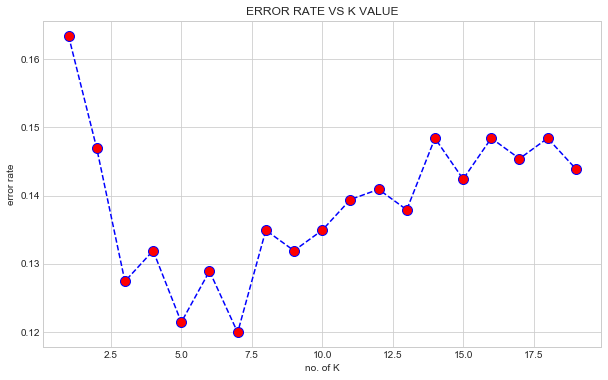

In [256]:
plt.figure(figsize=(10,6))
plt.plot(range(1,20),error_rate,color='blue',linestyle='dashed',marker = 'o',
        markerfacecolor='red',markersize = 10)
plt.title("ERROR RATE VS K VALUE")
plt.ylabel('error rate')
plt.xlabel('no. of K')
plt.show()

* From the above,we can see that the optimal value of K is 5(approx)

#### Predicting on Train set

In [257]:
y_train_pred = knn.predict(x_train)

In [261]:
print(confusion_matrix(y_train,y_train_pred))
print(classification_report(y_train,y_train_pred))

[[2283    6]
 [ 321   56]]
             precision    recall  f1-score   support

        0.0       0.88      1.00      0.93      2289
        1.0       0.90      0.15      0.26       377

avg / total       0.88      0.88      0.84      2666



#### Validating on Train set

In [262]:
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[553   8]
 [ 73  33]]
             precision    recall  f1-score   support

        0.0       0.88      0.99      0.93       561
        1.0       0.80      0.31      0.45       106

avg / total       0.87      0.88      0.86       667



### Clustering on separated data

In [263]:
churn_separated.head()

,Area Code,Phone,State
1,415.0,382-4657,KS
3,415.0,371-7191,OH
5,415.0,358-1921,NJ
7,408.0,375-9999,OH
9,415.0,330-6626,OK


In [264]:
churn_separated.dtypes

Area Code    float64
Phone         object
State         object
dtype: object

* In order to perform clustering,all the variables must be in the same datatype
#### Converting Categorical to Numeric

In [265]:
Area_state= churn_separated.groupby(['Area Code','State']).agg('count').reset_index()

In [266]:
Area_state.head()

,Area Code,State,Phone
0,408.0,AK,14
1,408.0,AL,25
2,408.0,AR,13
3,408.0,AZ,15
4,408.0,CA,7


In [267]:
print(len(Area_state))

153


In [268]:
Area_state['State'] = Area_state['State'].astype('category')

In [269]:
Area_state['State'] = Area_state['State'].cat.codes

#### Creating an X-array

In [279]:
X_array = Area_state[['State','Area Code','Phone']].values

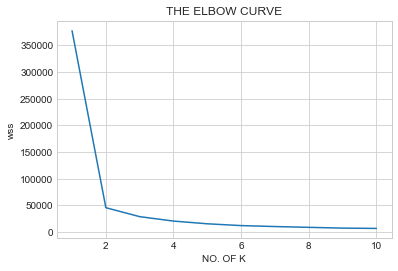

In [280]:
wss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i,init='k-means++',n_init=10,max_iter=300,random_state=3565)
    kmeans.fit(X_array)
    wss.append(kmeans.inertia_)
plt.plot(range(1,11),wss)
plt.title('THE ELBOW CURVE')
plt.xlabel('NO. OF K')
plt.ylabel('wss')
plt.show()

* From the above elbow curve,we can say that the optimal value could be 4

In [281]:
kmeans = KMeans(n_clusters = 4,init = 'k-means++',max_iter = 300,n_init=10,random_state = 3565)

In [282]:
y_kmeans = kmeans.fit_predict(X_array)
y_kmeans

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [283]:
print(len(y_kmeans))

153


In [284]:
Area_state.head()

,Area Code,State,Phone
0,408.0,0,14
1,408.0,1,25
2,408.0,2,13
3,408.0,3,15
4,408.0,4,7


In [285]:
cluster = churn_separated.groupby(['Area Code','State']).agg('count').reset_index()

In [286]:
print(len(cluster))
#cluster['cluster'] = y_kmeans

153


In [287]:
cluster['cluster']=y_kmeans

In [288]:
cluster.head()

,Area Code,State,Phone,cluster
0,408.0,AK,14,2
1,408.0,AL,25,2
2,408.0,AR,13,2
3,408.0,AZ,15,2
4,408.0,CA,7,2


In [289]:
churn_merged= pd.merge(churn_separated,cluster,on=['Area Code','State'])

#### Concating the clustered result to the main dataframe

In [290]:
churn['cluster'] = churn_merged['cluster']

In [291]:
churn.columns

Index(['Account Length', 'VMail Message', 'Day Mins', 'Eve Mins', 'Night Mins',
       'Intl Mins', 'CustServ Calls', 'Churn', 'Intl Plan', 'VMail Plan',
       'Day Calls', 'Day Charge', 'Daily Charges MV', 'Eve Calls',
       'Eve Charge', 'Night Calls', 'Night Charge', 'Intl Calls',
       'Intl Charge', 'cluster'],
      dtype='object')

### Performing logistic regression with the newly added cluster variable

#### Train-Test Split

In [294]:
x = churn[['CustServ Calls','Day Charge', 'Eve Charge', 'Night Charge',
       'Intl Calls', 'Intl Charge', 'Intl Plan', 'VMail Plan','cluster']]
y = churn['Churn']

#### Creating Dummies

In [297]:
x = pd.get_dummies(x,columns=['Intl Plan','VMail Plan','cluster'],drop_first=True)

#### Splitting the data

In [298]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=35)

### Performing Logistic Regression

In [300]:
classifier.fit(x_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=1, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [301]:
y_classifier_pred = classifier.predict(x_test)

#### Validating on test set

In [303]:
print(confusion_matrix(y_test,y_classifier_pred))
print(classification_report(y_test,y_classifier_pred))

[[847  15]
 [122  16]]
             precision    recall  f1-score   support

        0.0       0.87      0.98      0.93       862
        1.0       0.52      0.12      0.19       138

avg / total       0.82      0.86      0.82      1000



### Random Forest

In [305]:
rfclassifier = RandomForestClassifier(n_estimators=300,max_depth=7,min_samples_leaf=5,class_weight='balanced',random_state=69)

In [307]:
rfclassifier.fit(x_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=7, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=5,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=300, n_jobs=1, oob_score=False, random_state=69,
            verbose=0, warm_start=False)

#### Random forest validation

In [309]:
rfclassifier_pred=rfclassifier.predict(x_train)

In [310]:
print(confusion_matrix(y_train,rfclassifier_pred))
print(classification_report(y_train,rfclassifier_pred))

[[1870  118]
 [  40  305]]
             precision    recall  f1-score   support

        0.0       0.98      0.94      0.96      1988
        1.0       0.72      0.88      0.79       345

avg / total       0.94      0.93      0.94      2333



#### Validation on Test data

In [313]:
rfclassifier_pred_val = rfclassifier.predict(x_test)

In [315]:
print(confusion_matrix(y_test,rfclassifier_pred_val))
print(classification_report(y_test,rfclassifier_pred_val))

[[809  53]
 [ 43  95]]
             precision    recall  f1-score   support

        0.0       0.95      0.94      0.94       862
        1.0       0.64      0.69      0.66       138

avg / total       0.91      0.90      0.91      1000



In [316]:
rfclassifier.feature_importances_

array([0.1328602 , 0.34630561, 0.10955315, 0.06906301, 0.05777982,
       0.08092633, 0.14544769, 0.04440051, 0.004959  , 0.00455378,
       0.00415089])

In [320]:
dict(zip(x.columns.values,rfclassifier.feature_importances_))

{'CustServ Calls': 0.13286020294715142,
 'Day Charge': 0.3463056125761659,
 'Eve Charge': 0.10955314746277407,
 'Intl Calls': 0.057779823137550534,
 'Intl Charge': 0.08092633393716815,
 'Intl Plan_1.0': 0.14544769480967767,
 'Night Charge': 0.06906301123252656,
 'VMail Plan_1.0': 0.04440050905348669,
 'cluster_1.0': 0.004958997786674314,
 'cluster_2.0': 0.0045537808101758365,
 'cluster_3.0': 0.004150886246648842}

#### Top influenced variables from the above:

* CustServ Calls  : 0.21784574507107649,
* Day Charge      : 0.3153824424210542,
* Eve Charge      : 0.09586042786869987,
* Intl Calls      : 0.04813807365356402,
* Intl Charge     : 0.07033200333090232,
* Intl Plan_1.0'  : 0.1441838905079129,
* Night Charge    : 0.05482930403650932,
* VMail Plan_1.0  : 0.04312877234451399,
 

### Applying Logistic Regression only on Top Influenced variables

In [323]:
x = churn[['CustServ Calls','Day Charge', 'Eve Charge', 'Night Charge',
       'Intl Calls', 'Intl Charge', 'Intl Plan', 'VMail Plan']]

In [324]:
classifier.fit(x_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=1, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [325]:
y_train_pred = classifier.predict(x_train)

##### Validation on Trained data

In [327]:
print(confusion_matrix(y_train,y_train_pred))
print(classification_report(y_train,y_train_pred))

[[1950   38]
 [ 294   51]]
             precision    recall  f1-score   support

        0.0       0.87      0.98      0.92      1988
        1.0       0.57      0.15      0.24       345

avg / total       0.83      0.86      0.82      2333



##### Validation on Test data

In [328]:
y_test_pred = classifier.predict(x_test)

In [330]:
print(confusion_matrix(y_test,y_test_pred))
print(classification_report(y_test,y_test_pred))

[[847  15]
 [122  16]]
             precision    recall  f1-score   support

        0.0       0.87      0.98      0.93       862
        1.0       0.52      0.12      0.19       138

avg / total       0.82      0.86      0.82      1000



### Principal Component Analysis(PCA)

In [331]:
churn_pca = churn[['Account Length', 'VMail Message', 'Day Mins', 'Eve Mins', 'Night Mins',
       'Intl Mins', 'CustServ Calls','Day Calls', 'Day Charge', 'Eve Calls', 'Eve Charge', 'Night Calls',
       'Night Charge', 'Intl Calls', 'Intl Charge']]

In [332]:
churn_pca.dtypes

Account Length    float64
VMail Message     float64
Day Mins          float64
Eve Mins          float64
Night Mins        float64
Intl Mins         float64
CustServ Calls    float64
Day Calls         float64
Day Charge        float64
Eve Calls         float64
Eve Charge        float64
Night Calls       float64
Night Charge      float64
Intl Calls        float64
Intl Charge       float64
dtype: object

In [333]:
churn_pca = pd.DataFrame(sc.fit_transform(churn_pca),columns=churn_pca.columns)

In [336]:
pca = PCA(n_components=2)

In [337]:
churn_pca.shape

(3333, 15)

In [338]:
x_pca = pca.fit_transform(churn_pca)

In [339]:
x_pca.shape

(3333, 2)

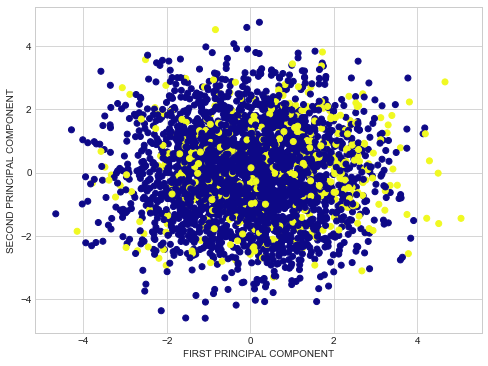

In [341]:
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:, 0],x_pca[:,1],c=churn['Churn'],cmap='plasma')
plt.xlabel("FIRST PRINCIPAL COMPONENT")
plt.ylabel("SECOND PRINCIPAL COMPONENT")
plt.show()

In [342]:
pca.components_

array([[-0.01739866,  0.01317783,  0.37391898,  0.28208013,  0.18773793,
        -0.49411631, -0.00296508, -0.02064021,  0.37383189, -0.00424635,
         0.28215904,  0.03541663,  0.18772023, -0.01556314, -0.49415614],
       [ 0.00492238,  0.00910303,  0.01365264,  0.46773214, -0.52336392,
         0.07923048, -0.0106309 , -0.03998193,  0.01366331, -0.01217824,
         0.46765977, -0.00516161, -0.52298478,  0.01431851,  0.07905015]])

In [344]:
pca_comp = pd.DataFrame(pca.components_,columns=[churn_pca.columns])
pca_comp

,Account Length,VMail Message,Day Mins,Eve Mins,Night Mins,Intl Mins,CustServ Calls,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,Intl Calls,Intl Charge
0,-0.017399,0.013178,0.373919,0.282080,0.187738,-0.494116,-0.002965,-0.020640,0.373832,-0.004246,0.282159,0.035417,0.187720,-0.015563,-0.494156
1,0.004922,0.009103,0.013653,0.467732,-0.523364,0.079230,-0.010631,-0.039982,0.013663,-0.012178,0.467660,-0.005162,-0.522985,0.014319,0.079050


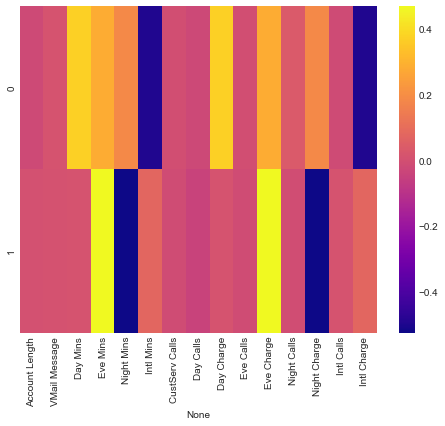

In [345]:
plt.figure(figsize=(8,6))
sns.heatmap(pca_comp,cmap='plasma')

* This graph shows the relationship between correlation of various features and principal components.

### Reading the data again

In [346]:
churn_df =pd.read_csv("Churn_Capstone.csv")

In [347]:
churn_df.dropna(axis=0,how='all',inplace=True)

In [348]:
churn_df = churn_df.reset_index()

In [349]:
pca_df = pd.DataFrame(x_pca)

In [351]:
pca_df['Intl Plan'] = churn_df['Intl Plan']
pca_df['VMail Plan'] = churn_df['VMail Plan']

In [353]:
pca_df['cluster'] = churn_merged['cluster']

In [354]:
pca_df.head()

,0,1,Intl Plan,VMail Plan,cluster
0,1.559940,-0.960012,0.0,1.0,2
1,-1.170226,-1.067569,0.0,1.0,2
2,-1.037052,-0.557038,0.0,0.0,2
3,1.461300,-2.506148,1.0,0.0,2
4,-0.790284,-0.782045,1.0,0.0,2


#### Creating Dummies

In [355]:
pca_df = pd.get_dummies(pca_df,columns=['Intl Plan','VMail Plan','cluster'],drop_first=True)

In [356]:
pca_df.head()

,0,1,Intl Plan_1.0,VMail Plan_1.0,cluster_1,cluster_2,cluster_3
0,1.559940,-0.960012,0,1,0,1,0
1,-1.170226,-1.067569,0,1,0,1,0
2,-1.037052,-0.557038,0,0,0,1,0
3,1.461300,-2.506148,1,0,0,1,0
4,-0.790284,-0.782045,1,0,0,1,0


#### Train Test Splitting

In [357]:
x = pca_df
y = churn_df['Churn']

In [358]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=40)

## Random Forest

In [359]:
rfclf = RandomForestClassifier(n_estimators=50)

In [361]:
rfclf.fit(x_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=50, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [362]:
tr_pred = rfclf.predict(x_train)

#### Validating on Train set

In [363]:
print(confusion_matrix(y_train,tr_pred))
print(classification_report(y_train,tr_pred))

[[1986    0]
 [   1  346]]
             precision    recall  f1-score   support

        0.0       1.00      1.00      1.00      1986
        1.0       1.00      1.00      1.00       347

avg / total       1.00      1.00      1.00      2333



#### Validation on Test set

In [365]:
test_pred = rfclf.predict(x_test)

In [366]:
print(confusion_matrix(y_train,tr_pred))
print(classification_report(y_train,tr_pred))

[[1986    0]
 [   1  346]]
             precision    recall  f1-score   support

        0.0       1.00      1.00      1.00      1986
        1.0       1.00      1.00      1.00       347

avg / total       1.00      1.00      1.00      2333



* This is the best result as of now.

In [367]:
rfclf.feature_importances_

array([0.46776712, 0.40205833, 0.07515038, 0.02571776, 0.00956051,
       0.01293368, 0.00681223])

In [369]:
dict(zip(x.columns.values,rfclf.feature_importances_))

{0: 0.4677671191799144,
 1: 0.40205832747616044,
 'Intl Plan_1.0': 0.07515037607598829,
 'VMail Plan_1.0': 0.025717756761720355,
 'cluster_1': 0.0095605075025209,
 'cluster_2': 0.01293368142147151,
 'cluster_3': 0.00681223158222404}

### PCA + CLUSTERING + LOGISTIC REGRESSION

In [370]:
classifier.fit(x_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=1, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [372]:
classifier_train_pred = classifier.predict(x_train)

#### Validation on Train set

In [373]:
print(classification_report(y_train,classifier_train_pred))
print(confusion_matrix(y_train,classifier_train_pred))

             precision    recall  f1-score   support

        0.0       0.86      0.98      0.92      1986
        1.0       0.38      0.06      0.11       347

avg / total       0.79      0.85      0.80      2333

[[1950   36]
 [ 325   22]]


#### Validation on Test set

In [374]:
classifier_test_pred = classifier.predict(x_test)

In [375]:
print(confusion_matrix(y_test,classifier_test_pred))
print(classification_report(y_test,classifier_test_pred))

[[854  10]
 [123  13]]
             precision    recall  f1-score   support

        0.0       0.87      0.99      0.93       864
        1.0       0.57      0.10      0.16       136

avg / total       0.83      0.87      0.82      1000



* Can the test prediction results be greater than the train results..??

## ADABOOST

In [377]:
aclf = AdaBoostClassifier(n_estimators=600,random_state=56)

In [378]:
aclf.fit(x_train,y_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=600, random_state=56)

In [379]:
aclf_train_preds = aclf.predict(x_train)

#### Validation on Train data

In [381]:
print(confusion_matrix(y_train,aclf_train_preds))
print(classification_report(y_train,aclf_train_preds))

[[1959   27]
 [ 273   74]]
             precision    recall  f1-score   support

        0.0       0.88      0.99      0.93      1986
        1.0       0.73      0.21      0.33       347

avg / total       0.86      0.87      0.84      2333



#### Validation on Test Data

In [382]:
aclf_test_preds = aclf.predict(x_test)

In [383]:
print(confusion_matrix(y_test,aclf_test_preds))
print(classification_report(y_test,aclf_test_preds))

[[838  26]
 [121  15]]
             precision    recall  f1-score   support

        0.0       0.87      0.97      0.92       864
        1.0       0.37      0.11      0.17       136

avg / total       0.80      0.85      0.82      1000



In [384]:
dict(zip(x.columns.values,aclf.feature_importances_))

{0: 0.38,
 1: 0.6083333333333333,
 'Intl Plan_1.0': 0.005,
 'VMail Plan_1.0': 0.0033333333333333335,
 'cluster_1': 0.0,
 'cluster_2': 0.0016666666666666668,
 'cluster_3': 0.0016666666666666668}

### BAGGING CLASSIFIER

In [386]:
bclf = BaggingClassifier(n_estimators=20,random_state=69)

In [388]:
bclf.fit(x_train,y_train)

BaggingClassifier(base_estimator=None, bootstrap=True,
         bootstrap_features=False, max_features=1.0, max_samples=1.0,
         n_estimators=20, n_jobs=1, oob_score=False, random_state=69,
         verbose=0, warm_start=False)

#### Validation on train set

In [389]:
bclf_train_preds = bclf.predict(x_train)

In [391]:
print(confusion_matrix(y_train,bclf_train_preds))
print(classification_report(y_train,bclf_train_preds))

[[1986    0]
 [  25  322]]
             precision    recall  f1-score   support

        0.0       0.99      1.00      0.99      1986
        1.0       1.00      0.93      0.96       347

avg / total       0.99      0.99      0.99      2333



#### Validation on Test set

In [392]:
bclf_test_preds = bclf.predict(x_test)

In [393]:
print(confusion_matrix(y_test,bclf_test_preds))
print(classification_report(y_test,bclf_test_preds))

[[820  44]
 [115  21]]
             precision    recall  f1-score   support

        0.0       0.88      0.95      0.91       864
        1.0       0.32      0.15      0.21       136

avg / total       0.80      0.84      0.82      1000



In [395]:
aclf.feature_importances_

array([0.38      , 0.60833333, 0.005     , 0.00333333, 0.        ,
       0.00166667, 0.00166667])

### GRADIENT BOOSTING

In [397]:
gclf = GradientBoostingClassifier(n_estimators=3000,verbose=True,min_samples_leaf=5)

In [398]:
gclf.fit(x_train,y_train)

      Iter       Train Loss   Remaining Time 
         1           0.8117            7.39m
         2           0.7928            3.82m
         3           0.7780            3.03m
         4           0.7670            2.32m
         5           0.7582            1.89m
         6           0.7515            1.60m
         7           0.7456            1.46m
         8           0.7409            1.48m
         9           0.7358            1.34m
        10           0.7323            1.46m
        20           0.7062           54.35s
        30           0.6902           48.58s
        40           0.6741           45.48s
        50           0.6632           42.57s
        60           0.6513           37.27s
        70           0.6428           33.55s
        80           0.6302           31.81s
        90           0.6216           29.18s
       100           0.6122           27.22s
       200           0.5358           19.17s
       300           0.4795           17.74s
       40

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=5, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=3000,
              presort='auto', random_state=None, subsample=1.0,
              verbose=True, warm_start=False)

In [399]:
gclf_train_preds = gclf.predict(x_train)

In [401]:
print(confusion_matrix(y_train,gclf_train_preds))
print(classification_report(y_train,gclf_train_preds))

[[1986    0]
 [   0  347]]
             precision    recall  f1-score   support

        0.0       1.00      1.00      1.00      1986
        1.0       1.00      1.00      1.00       347

avg / total       1.00      1.00      1.00      2333



#### Validation on Test Data

In [403]:
gclf_test_preds = gclf.predict(x_test)

In [404]:
print(confusion_matrix(y_test,gclf_test_preds))
print(classification_report(y_test,gclf_test_preds))

[[812  52]
 [104  32]]
             precision    recall  f1-score   support

        0.0       0.89      0.94      0.91       864
        1.0       0.38      0.24      0.29       136

avg / total       0.82      0.84      0.83      1000



### PCA + SVM + CLUSTER

In [406]:
svc = SVC(class_weight='balanced')

In [407]:
svc.fit(x_train,y_train)

SVC(C=1.0, cache_size=200, class_weight='balanced', coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

#### Validation on Train data

In [408]:
svc_train_preds = svc.predict(x_train)

In [411]:
print(confusion_matrix(y_train,svc_train_preds))
print(classification_report(y_train,svc_train_preds))

[[1603  383]
 [ 136  211]]
             precision    recall  f1-score   support

        0.0       0.92      0.81      0.86      1986
        1.0       0.36      0.61      0.45       347

avg / total       0.84      0.78      0.80      2333



#### Validation on test data

In [412]:
svc_test_preds = svc.predict(x_test)

In [414]:
print(confusion_matrix(y_test,svc_test_preds))
print(classification_report(y_test,svc_test_preds))

[[717 147]
 [ 62  74]]
             precision    recall  f1-score   support

        0.0       0.92      0.83      0.87       864
        1.0       0.33      0.54      0.41       136

avg / total       0.84      0.79      0.81      1000



### GRID SEARCH

In [416]:
param_grid = {'C':[0.1,1,10,100,1000],'gamma':[1,0.1,0.01,0.001,0.0001]}

In [417]:
grid = GridSearchCV(SVC(),param_grid,verbose=3)

In [418]:
grid.fit(x_train,y_train)

Fitting 3 folds for each of 25 candidates, totalling 75 fits
[CV] C=0.1, gamma=1 ..................................................
[CV] ......................... C=0.1, gamma=1, score=0.850900 -   0.3s
[CV] C=0.1, gamma=1 ..................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s remaining:    0.0s


[CV] ......................... C=0.1, gamma=1, score=0.850900 -   0.0s
[CV] C=0.1, gamma=1 ..................................................
[CV] ......................... C=0.1, gamma=1, score=0.851995 -   0.1s
[CV] C=0.1, gamma=0.1 ................................................
[CV] ....................... C=0.1, gamma=0.1, score=0.850900 -   0.0s
[CV] C=0.1, gamma=0.1 ................................................
[CV] ....................... C=0.1, gamma=0.1, score=0.850900 -   0.0s
[CV] C=0.1, gamma=0.1 ................................................
[CV] ....................... C=0.1, gamma=0.1, score=0.851995 -   0.0s
[CV] C=0.1, gamma=0.01 ...............................................
[CV] ...................... C=0.1, gamma=0.01, score=0.850900 -   0.0s
[CV] C=0.1, gamma=0.01 ...............................................
[CV] ...................... C=0.1, gamma=0.01, score=0.850900 -   0.0s
[CV] C=0.1, gamma=0.01 ...............................................
[CV] .

[CV] C=1000, gamma=1 .................................................
[CV] ........................ C=1000, gamma=1, score=0.796915 -   2.0s
[CV] C=1000, gamma=1 .................................................
[CV] ........................ C=1000, gamma=1, score=0.825193 -   0.8s
[CV] C=1000, gamma=1 .................................................
[CV] ........................ C=1000, gamma=1, score=0.799228 -   1.4s
[CV] C=1000, gamma=0.1 ...............................................
[CV] ...................... C=1000, gamma=0.1, score=0.840617 -   4.8s
[CV] C=1000, gamma=0.1 ...............................................
[CV] ...................... C=1000, gamma=0.1, score=0.843188 -   4.4s
[CV] C=1000, gamma=0.1 ...............................................
[CV] ...................... C=1000, gamma=0.1, score=0.859717 -   6.8s
[CV] C=1000, gamma=0.01 ..............................................
[CV] ..................... C=1000, gamma=0.01, score=0.858612 -   1.6s
[CV] C

[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:   56.6s finished


GridSearchCV(cv=None, error_score='raise',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=3)

In [419]:
grid.best_estimator_

SVC(C=1000, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.01, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [420]:
grid.best_params_

{'C': 1000, 'gamma': 0.01}

In [421]:
grid_preds = grid.predict(x_test)

In [422]:
print(confusion_matrix(y_test,grid_preds))
print(classification_report(y_test,grid_preds))

[[858   6]
 [126  10]]
             precision    recall  f1-score   support

        0.0       0.87      0.99      0.93       864
        1.0       0.62      0.07      0.13       136

avg / total       0.84      0.87      0.82      1000

